In [ ]:
globals().clear()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import random
import time
from scipy.stats import norm as norm
from IPython.core.display import display_pretty
from statistics import mean
from google.colab import files
import os

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
images_dir = '/content/gdrive/My Drive/DDMRP/GSK' 

Mounted at /content/gdrive


In [ ]:
scenario_name = '000'

try:
    os.mkdir('/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/DDMRP Sim_'+scenario_name)
except:
    pass 

## **Model**

In [ ]:
class DDMRP():
    def __init__(self, time, ini_realdemand, ini_demand, ini_leadtime, ini_moq, ini_title, ini_onhand, ini_desiredorder, ini_ltadj, ini_varadj, ini_bt):
        self.time = time 

        # Basic
        self.df1 = ini_demand 
        self.df2 = ini_realdemand
        self.ADU = 0
        self.ADUBackTrack = ini_bt
        self.LT = ini_leadtime 
        self.Lt_Adj = ini_ltadj 
        self.Var_Adj= ini_varadj 
        self.MOQ = ini_moq 
        self.batch = 1 #constant?
        self.title = ini_title
        self.desiredorder = ini_desiredorder 
        self.daily_demand = 0
        self.ADUnow = 0

        # Stock Level
        self.OrderReceived = 0
        self.AvailableStock = 0

        # Order
        self.SuggestedOrder = 0 #$$$$$
        self.LastOrderTime = 0 #$$$$$
        
        # Traffic
        self.RedBase = 0
        self.RedSafety = 0
        self.TOR = 0
        self.TOY = 0
        self.TOG = 0

        # Records
        if self.time == startcuckoo:
          self.hist_time = []
          self.hist_demand = []
          self.hist_onhand = []
          self.hist_send = [] 
          self.hist_order = []
          self.hist_TOR = []
          self.hist_TOG = []
          self.hist_TOY = []
          self.stockout = []
          self.NumOrder = []
          self.hist_fillrate = []
          self.sg = {} # order log
          self.gh = {} # actual receive log
          for v in np.arange(self.time - self.LT, self.time + 1): #ini order/acutal receive log
            self.sg[v] = 0
            self.gh[v] = 0  
          self.OrderOnHand = ini_onhand
          self.OpenSupply = 0 #pipeline inventory
        else:
          self.hist_time = dic[(ini_title, cuckoo - 1)].hist_time
          self.hist_demand = dic[(ini_title, cuckoo - 1)].hist_demand
          self.hist_onhand = dic[(ini_title, cuckoo - 1)].hist_onhand
          self.hist_send = dic[(ini_title, cuckoo - 1)].hist_send
          self.hist_order = dic[(ini_title, cuckoo - 1)].hist_order
          self.hist_TOR = dic[(ini_title, cuckoo - 1)].hist_TOR
          self.hist_TOG = dic[(ini_title, cuckoo - 1)].hist_TOG
          self.hist_TOY = dic[(ini_title, cuckoo - 1)].hist_TOY
          self.stockout = dic[(ini_title, cuckoo - 1)].stockout
          self.hist_fillrate = dic[(ini_title, cuckoo - 1)].hist_fillrate  
          self.sg = dic[(ini_title, cuckoo - 1)].sg
          self.gh = dic[(ini_title, cuckoo - 1)].gh
          self.OrderOnHand = dic[(ini_title, cuckoo - 1)].OrderOnHand
          self.OpenSupply = dic[(ini_title, cuckoo - 1)].OpenSupply
          self.NumOrder = dic[(ini_title, cuckoo - 1)].NumOrder
        
    def generate_demand(self):
        demandgen = self.df2.iloc[self.time : self.time + 1].mean(axis=0)
        return demandgen

    def CalculateADU(self):
        if self.time < self.ADUBackTrack:
          ADU = self.df1.iloc[0 : self.time + 1].mean(axis=0)
        else: 
          ADU = self.df1.iloc[self.time - self.ADUBackTrack: self.time].mean(axis=0) 
        return ADU

    def simulate(self):
        self.daily_demand = self.generate_demand()[0]
        self.ADUnow = self.CalculateADU()[0]

        # Demand
        passed = self.time - self.LT
        self.OrderReceived = self.gh[passed]
        self.OpenSupply -= self.sg[passed]
        self.hist_order.append(self.OrderReceived)
        
        self.OrderOnHand = max(self.OrderOnHand - self.daily_demand + self.OrderReceived, 0)
        if self.OrderOnHand < self.daily_demand:
          self.stockout.append(1)
          self.hist_fillrate.append(self.OrderOnHand/self.daily_demand)
        else:
          self.stockout.append(0)
          self.hist_fillrate.append(1)
        self.AvailableStock = self.OrderOnHand + self.OpenSupply - self.daily_demand 
        
        # Traffic
        self.RedBase = self.LT * self.ADUnow * self.Lt_Adj
        self.RedSafety = self.RedBase * self.Var_Adj
        self.TOR = self.RedBase + self.RedSafety
        self.TOY = self.TOR + self.LT * self.ADUnow
        self.TOG = self.TOY + max(self.MOQ, self.LT * self.ADUnow * self.Lt_Adj, self.desiredorder * self.ADUnow)
        
        # Order
        if self.AvailableStock <= self.TOY:
          self.NumOrder.append(1)
          self.SuggestedOrder = max(self.MOQ, self.TOG - self.AvailableStock)
          self.hist_send.append(self.SuggestedOrder)
          self.OpenSupply += self.SuggestedOrder
          self.sg[self.time] = self.SuggestedOrder
          self.gh[self.time] = self.SuggestedOrder
        else:
          self.NumOrder.append(0)
          self.hist_send.append(0)
          self.sg[self.time] = 0
          self.gh[self.time] = 0
        
        # Record
        self.hist_time.append(self.time)
        self.hist_onhand.append(self.OrderOnHand)
        self.hist_demand.append(self.daily_demand)
        self.hist_TOR.append(self.TOR)
        self.hist_TOY.append(self.TOY)
        self.hist_TOG.append(self.TOG)
        
    def plot_inventorylevel(self):
        dd = plt.figure(self.title)

        startpoint = 361
        plt.plot(self.hist_time[startpoint:], self.hist_demand[startpoint:], color = 'black', linewidth= 4)
        plt.plot(self.hist_time[startpoint:], self.hist_TOR[startpoint:], color = 'red')
        plt.plot(self.hist_time[startpoint:], self.hist_TOY[startpoint:], color = 'yellow')
        plt.plot(self.hist_time[startpoint:], self.hist_TOG[startpoint:], color = 'green')
        plt.plot(self.hist_time[startpoint:], self.hist_onhand[startpoint:], color = 'blue', linewidth= 4)
        plt.plot(self.hist_time[startpoint:], self.hist_order[startpoint:], color = 'brown', linewidth= 2)
        plt.plot(self.hist_time[startpoint:], self.hist_send[startpoint:], color = 'grey', linewidth= 2)

        plt.xticks(np.arange(startpoint,720, 1))

        x = np.arange(startpoint,720, 1)
        y1_red = np.array(self.hist_TOR[startpoint:])
        y1_yellow = np.array(self.hist_TOY[startpoint:])
        y1_green = np.array(self.hist_TOG[startpoint:])
        y2 = np.zeros(720-startpoint)

        plt.fill_between(x, y1_green, y2, color='green')
        plt.fill_between(x, y1_yellow, y2, color='yellow')
        plt.fill_between(x, y1_red, y2, color='red')

        plt.grid(True)
        plt.xlabel('nth month')
        plt.title(self.title)
        dd.show()

        fig = plt.gcf()
        fig.set_size_inches(90, 30)
        images_dir = '/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/DDMRP Sim_'+scenario_name + '/'
        fig.savefig(f"{images_dir}"+self.title + ".png")

## **Nodes**

In [ ]:
# def demandGenerator(dataframe, periods):
#   from numpy import random
#   dataframe.columns = ['demand']
#   demandlist = dataframe.demand.tolist()
#   result = []
#   save_std = []
#   save_avg = []
#   stdev = np.std(demandlist)/np.sqrt(periods)
#   for i in demandlist:
#     avg = i/periods
#     for i in range(periods):
#       std = np.random.normal(0, stdev)
#       save_std.append(std)
#       save_avg.append(avg)
#   return pd.DataFrame(save_std), pd.DataFrame(save_avg)

# dgA1 = demandGenerator(pd.read_excel('/content/gdrive/My Drive/DDMRP/GSK/Demand Data/' +'10000000081445_BR02.xlsx', header=None).iloc[0:35], 30)
# dgA2 = demandGenerator(pd.read_excel('/content/gdrive/My Drive/DDMRP/GSK/Demand Data/' +'10000000070547_FR55.xlsx', header=None).iloc[0:35], 30)
# dgA3 = demandGenerator(pd.read_excel('/content/gdrive/My Drive/DDMRP/GSK/Demand Data/' +'10000000070547_PT01.xlsx', header=None).iloc[0:35], 30)

# dgA1[0].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A1_std.xlsx', index = False)
# dgA2[0].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A2_std.xlsx', index = False)
# dgA3[0].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A3_std.xlsx', index = False)

# dgA1[1].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A1_avg.xlsx', index = False)
# dgA2[1].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A2_avg.xlsx', index = False)
# dgA3[1].to_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A3_avg.xlsx', index = False)

In [ ]:
# scale_std = 1

# A1_std = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A1_std.xlsx')
# A2_std = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A2_std.xlsx')
# A3_std = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A3_std.xlsx')

# A1_avg = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A1_avg.xlsx')
# A2_avg = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A2_avg.xlsx')
# A3_avg = pd.read_excel(r'/content/gdrive/My Drive/DDMRP/GSK/Demand Data/SA_A3_avg.xlsx')

# # A1_demand = A1_std * scale_std + A1_avg
# # A2_demand = A2_std * scale_std + A2_avg
# # A3_demand = A3_std * scale_std + A3_avg

# A1_demand = pd.DataFrame(A1_demand[0].apply(lambda x: 0 if x < 0 else x))
# A2_demand = pd.DataFrame(A2_demand[0].apply(lambda x: 0 if x < 0 else x))
# A3_demand = pd.DataFrame(A3_demand[0].apply(lambda x: 0 if x < 0 else x))

A_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand 2.xlsx',header=4))
# A1_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,1])
# A2_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,2])
# A3_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,3])
# A4_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,4])
# A5_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,5])
# A6_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,6])
# A7_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,7])
# A8_demand = pd.DataFrame(pd.read_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/Demand/SA Demand.xlsx',header=4).iloc[:,8])

In [ ]:
# Demand
A1_demand = pd.DataFrame(A_demand.iloc[:,1])
A2_demand = pd.DataFrame(A_demand.iloc[:,2])
A3_demand = pd.DataFrame(A_demand.iloc[:,3])
A4_demand = pd.DataFrame(A_demand.iloc[:,4])
A5_demand = pd.DataFrame(A_demand.iloc[:,5])
A6_demand = pd.DataFrame(A_demand.iloc[:,6])
A7_demand = pd.DataFrame(A_demand.iloc[:,7])
A8_demand = pd.DataFrame(A_demand.iloc[:,8])

A1_builddemand = pd.DataFrame(A_demand.iloc[:,1])
A2_builddemand = pd.DataFrame(A_demand.iloc[:,2])
A3_builddemand = pd.DataFrame(A_demand.iloc[:,3])
A4_builddemand = pd.DataFrame(A_demand.iloc[:,4])
A5_builddemand = pd.DataFrame(A_demand.iloc[:,5])
A6_builddemand = pd.DataFrame(A_demand.iloc[:,6])
A7_builddemand = pd.DataFrame(A_demand.iloc[:,7])
A8_builddemand = pd.DataFrame(A_demand.iloc[:,8])

B1_builddemand = pd.DataFrame(A_demand.iloc[:,1] + A_demand.iloc[:,2])
B2_builddemand = pd.DataFrame(A_demand.iloc[:,3] + A_demand.iloc[:,4])
B3_builddemand = pd.DataFrame(A_demand.iloc[:,5] + A_demand.iloc[:,6])
B4_builddemand = pd.DataFrame(A_demand.iloc[:,7] + A_demand.iloc[:,8])

C1_builddemand = pd.DataFrame(A_demand.iloc[:,1] + A_demand.iloc[:,2] + A_demand.iloc[:,3] + A_demand.iloc[:,4])
C2_builddemand = pd.DataFrame(A_demand.iloc[:,5] + A_demand.iloc[:,6] + A_demand.iloc[:,7] + A_demand.iloc[:,8])

D1_builddemand = pd.DataFrame(A_demand.iloc[:,1] + A_demand.iloc[:,2] + A_demand.iloc[:,3] + A_demand.iloc[:,4] + A_demand.iloc[:,5] + A_demand.iloc[:,6] + A_demand.iloc[:,7] + A_demand.iloc[:,8])

# Leadtime
LT_default = 8

A1_LT = LT_default
A2_LT = LT_default
A3_LT = LT_default
A4_LT = LT_default
A5_LT = LT_default
A6_LT = LT_default
A7_LT = LT_default
A8_LT = LT_default

B1_LT = LT_default
B2_LT = LT_default
B3_LT = LT_default
B4_LT = LT_default

C1_LT = LT_default
C2_LT = LT_default

D1_LT = LT_default

# Order On Hand
A_default = 15680
B_default = 31360
C_default = 62720
D_default = 125440

A1_OrderOnHand = A_default
A2_OrderOnHand = A_default
A3_OrderOnHand = A_default
A4_OrderOnHand = A_default
A5_OrderOnHand = A_default
A6_OrderOnHand = A_default
A7_OrderOnHand = A_default
A8_OrderOnHand = A_default

B1_OrderOnHand = B_default
B2_OrderOnHand = B_default
B3_OrderOnHand = B_default
B4_OrderOnHand = B_default

C1_OrderOnHand = C_default
C2_OrderOnHand = C_default

D1_OrderOnHand = D_default

# Desired Order Frequency
desiredorder_default = 8

A1_desiredorder = desiredorder_default
A2_desiredorder = desiredorder_default
A3_desiredorder = desiredorder_default
A4_desiredorder = desiredorder_default
A5_desiredorder = desiredorder_default
A6_desiredorder = desiredorder_default
A7_desiredorder = desiredorder_default
A8_desiredorder = desiredorder_default

B1_desiredorder = desiredorder_default
B2_desiredorder = desiredorder_default
B3_desiredorder = desiredorder_default
B4_desiredorder = desiredorder_default

C1_desiredorder = desiredorder_default
C2_desiredorder = desiredorder_default

D1_desiredorder = desiredorder_default

# Leadtime Adjust
LTAdj_default = 0.6

A1_LTAdj = LTAdj_default
A2_LTAdj = LTAdj_default
A3_LTAdj = LTAdj_default
A4_LTAdj = LTAdj_default
A5_LTAdj = LTAdj_default
A6_LTAdj = LTAdj_default
A7_LTAdj = LTAdj_default
A8_LTAdj = LTAdj_default

B1_LTAdj = LTAdj_default
B2_LTAdj = LTAdj_default
B3_LTAdj = LTAdj_default
B4_LTAdj = LTAdj_default

C1_LTAdj = LTAdj_default
C2_LTAdj = LTAdj_default

D1_LTAdj = LTAdj_default

# Var Adjust
varAdj_default = 0.6

A1_varAdj = varAdj_default
A2_varAdj = varAdj_default
A3_varAdj = varAdj_default
A4_varAdj = varAdj_default
A5_varAdj = varAdj_default
A6_varAdj = varAdj_default
A7_varAdj = varAdj_default
A8_varAdj = varAdj_default

B1_varAdj = varAdj_default
B2_varAdj = varAdj_default
B3_varAdj = varAdj_default
B4_varAdj = varAdj_default

C1_varAdj = varAdj_default
C2_varAdj = varAdj_default

D1_varAdj = varAdj_default

# ADU Back Track
ADUBackTrack_default = 60

A1_ADUBackTrack = ADUBackTrack_default
A2_ADUBackTrack = ADUBackTrack_default
A3_ADUBackTrack = ADUBackTrack_default
A4_ADUBackTrack = ADUBackTrack_default
A5_ADUBackTrack = ADUBackTrack_default
A6_ADUBackTrack = ADUBackTrack_default
A7_ADUBackTrack = ADUBackTrack_default
A8_ADUBackTrack = ADUBackTrack_default

B1_ADUBackTrack = ADUBackTrack_default
B2_ADUBackTrack = ADUBackTrack_default
B3_ADUBackTrack = ADUBackTrack_default
B4_ADUBackTrack = ADUBackTrack_default

C1_ADUBackTrack = ADUBackTrack_default
C2_ADUBackTrack = ADUBackTrack_default

D1_ADUBackTrack = ADUBackTrack_default

# MOQ
A1_MOQ = 1
A2_MOQ = 1
A3_MOQ = 1
A4_MOQ = 1
A5_MOQ = 1
A6_MOQ = 1
A7_MOQ = 1
A8_MOQ = 1

B1_MOQ = 1
B2_MOQ = 1
B3_MOQ = 1
B4_MOQ = 1

C1_MOQ = 1
C2_MOQ = 1

D1_MOQ = 1

# Title
A1_title = 'A1'
A2_title = 'A2'
A3_title = 'A3'
A4_title = 'A4'
A5_title = 'A5'
A6_title = 'A6'
A7_title = 'A7'
A8_title = 'A8'

B1_title = 'B1'
B2_title = 'B2'
B3_title = 'B3'
B4_title = 'B4'

C1_title = 'C1'
C2_title = 'C2'

D1_title = 'D1'

## **Simulate**

In [ ]:
lis = ['A1','A2','A3','A4','A5','A6','A7','A8','B1','B2','B3','B4','C1','C2','D1']
lisA = ['A1','A2','A3','A4','A5','A6','A7','A8']
lisB = ['B1','B2','B3','B4']
lisC = ['C1','C2']
lisD = ['D1']
dic = {}

startcuckoo = 0
cuckoo = startcuckoo
zero = pd.DataFrame(np.zeros((10, 1)))

# simulate
while cuckoo <= len(A1_demand) - 1:
  # ------------------------------ A ------------------------------
  for i in lisA:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()
  
  # agg demand
  sumAforB1 = [a1 + a2 for a1, a2 in zip(dic[('A1',cuckoo)].hist_send, dic[('A2',cuckoo)].hist_send)] #B1
  sumAforB2 = [a3 + a4 for a3, a4 in zip(dic[('A3',cuckoo)].hist_send, dic[('A4',cuckoo)].hist_send)] #B2
  sumAforB3 = [a5 + a6 for a5, a6 in zip(dic[('A5',cuckoo)].hist_send, dic[('A6',cuckoo)].hist_send)] #B3
  sumAforB4 = [a7 + a8 for a7, a8 in zip(dic[('A7',cuckoo)].hist_send, dic[('A8',cuckoo)].hist_send)] #B4
  B1_demand = zero.append(pd.DataFrame(sumAforB1))
  B2_demand = zero.append(pd.DataFrame(sumAforB2))
  B3_demand = zero.append(pd.DataFrame(sumAforB3))
  B4_demand = zero.append(pd.DataFrame(sumAforB4))
  # ------------------------------ B ------------------------------
  for i in lisB:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()
  
  # adj back order
  if cuckoo > A1_ADUBackTrack:
    dic[('A1', cuckoo)].gh[cuckoo] = min(dic[('B1', cuckoo)].OrderOnHand/(dic[('B1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A1', cuckoo)].gh[cuckoo]
    dic[('A2', cuckoo)].gh[cuckoo] = min(dic[('B1', cuckoo)].OrderOnHand/(dic[('B1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A2', cuckoo)].gh[cuckoo]
    dic[('A3', cuckoo)].gh[cuckoo] = min(dic[('B2', cuckoo)].OrderOnHand/(dic[('B2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A3', cuckoo)].gh[cuckoo]
    dic[('A4', cuckoo)].gh[cuckoo] = min(dic[('B2', cuckoo)].OrderOnHand/(dic[('B2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A4', cuckoo)].gh[cuckoo]
    dic[('A5', cuckoo)].gh[cuckoo] = min(dic[('B3', cuckoo)].OrderOnHand/(dic[('B3', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A5', cuckoo)].gh[cuckoo]
    dic[('A6', cuckoo)].gh[cuckoo] = min(dic[('B3', cuckoo)].OrderOnHand/(dic[('B3', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A6', cuckoo)].gh[cuckoo]
    dic[('A7', cuckoo)].gh[cuckoo] = min(dic[('B4', cuckoo)].OrderOnHand/(dic[('B4', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A7', cuckoo)].gh[cuckoo]
    dic[('A8', cuckoo)].gh[cuckoo] = min(dic[('B4', cuckoo)].OrderOnHand/(dic[('B4', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('A8', cuckoo)].gh[cuckoo]
  
  # agg demand  
  sumBforC1 = [b1 + b2 for b1, b2 in zip(dic[('B1',cuckoo)].hist_send, dic[('B2',cuckoo)].hist_send)] #C1
  sumBforC2 = [b3 + b4 for b3, b4 in zip(dic[('B3',cuckoo)].hist_send, dic[('B4',cuckoo)].hist_send)] #C2
  C1_demand = zero.append(pd.DataFrame(sumBforC1))
  C2_demand = zero.append(pd.DataFrame(sumBforC2))
  # ------------------------------ C ------------------------------
  for i in lisC:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack:
    dic[('B1', cuckoo)].gh[cuckoo] = min(dic[('C1', cuckoo)].OrderOnHand/(dic[('C1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B1', cuckoo)].gh[cuckoo]
    dic[('B2', cuckoo)].gh[cuckoo] = min(dic[('C1', cuckoo)].OrderOnHand/(dic[('C1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B2', cuckoo)].gh[cuckoo]
    dic[('B3', cuckoo)].gh[cuckoo] = min(dic[('C2', cuckoo)].OrderOnHand/(dic[('C2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B3', cuckoo)].gh[cuckoo]
    dic[('B4', cuckoo)].gh[cuckoo] = min(dic[('C2', cuckoo)].OrderOnHand/(dic[('C2', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('B4', cuckoo)].gh[cuckoo]
    
  # agg demand
  sumCforD1 = [c1 for c1 in zip(dic[('C1',cuckoo)].hist_send)] #D1
  D1_demand = zero.append(pd.DataFrame(sumCforD1))
  # ------------------------------ D ------------------------------
  for i in lisD:
    dic[(i, cuckoo)] = DDMRP(cuckoo, globals()[i+"_demand"], globals()[i+"_builddemand"], globals()[i+"_LT"], globals()[i+"_MOQ"], globals()[i+"_title"], globals()[i+"_OrderOnHand"], globals()[i+"_desiredorder"], \
                             globals()[i+"_LTAdj"], globals()[i+"_varAdj"], globals()[i+"_ADUBackTrack"])
    dic[(i, cuckoo)].simulate()

  # adj back order
  if cuckoo > A1_ADUBackTrack + B1_ADUBackTrack + C1_ADUBackTrack:
    dic[('C1', cuckoo)].gh[cuckoo] = min(dic[('D1', cuckoo)].OrderOnHand/(dic[('D1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('C1', cuckoo)].gh[cuckoo]
    dic[('C2', cuckoo)].gh[cuckoo] = min(dic[('D1', cuckoo)].OrderOnHand/(dic[('D1', cuckoo)].daily_demand + 0.0000000001), 1) * dic[('C2', cuckoo)].gh[cuckoo]

  cuckoo += 1

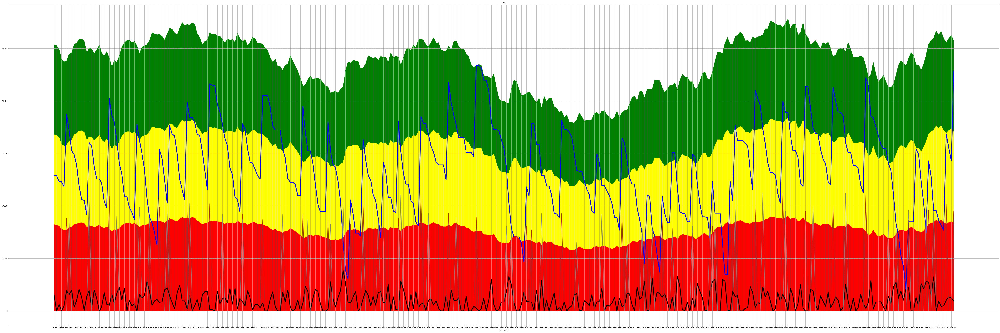

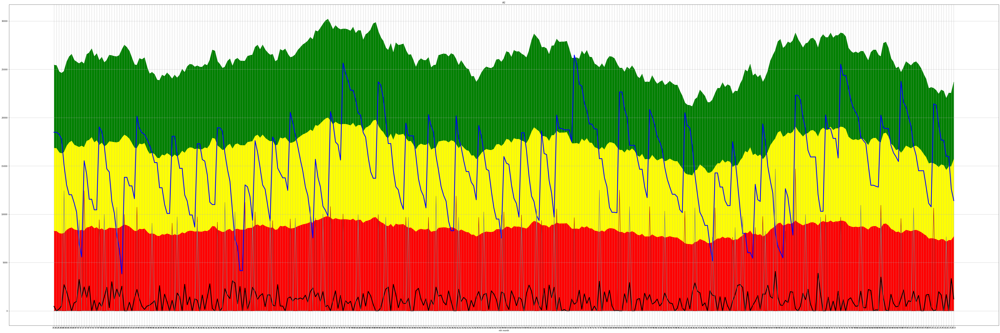

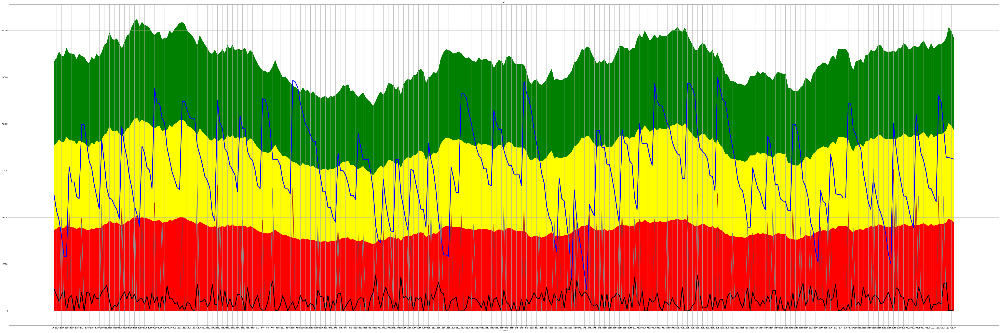

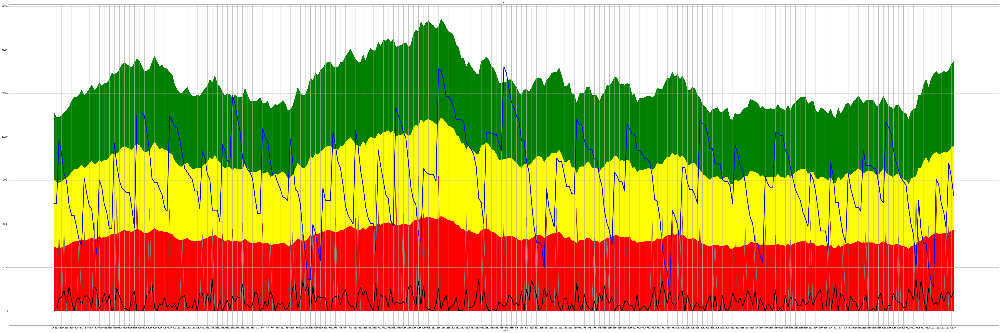

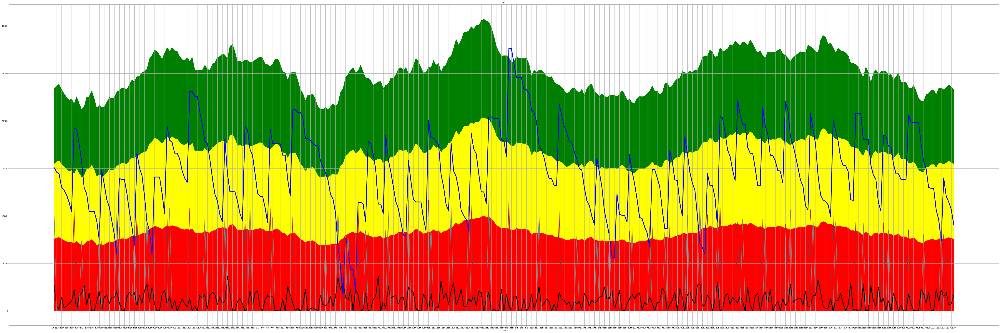

...

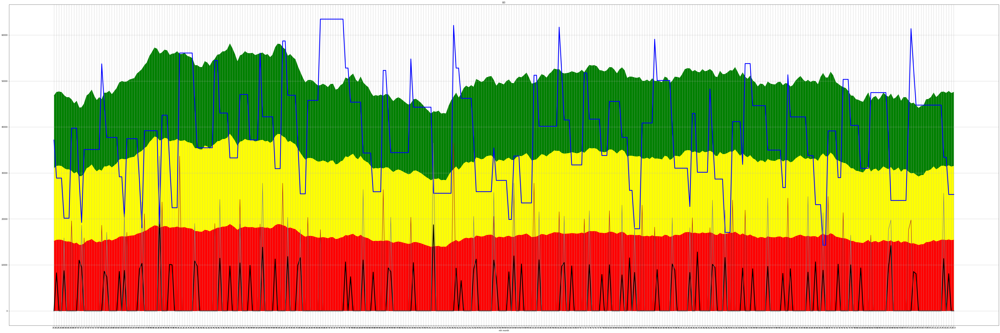

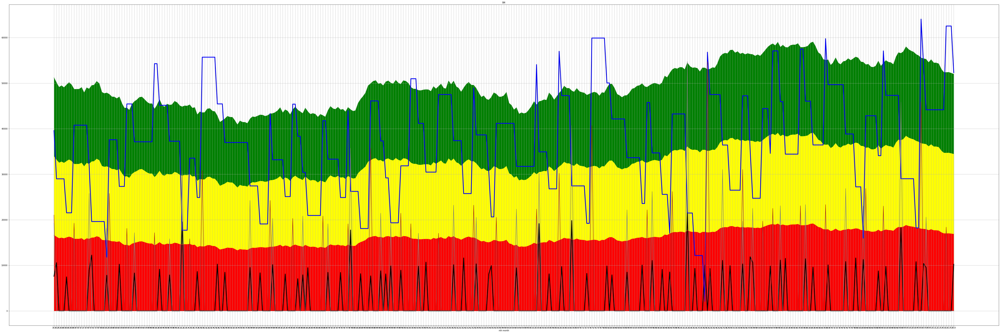

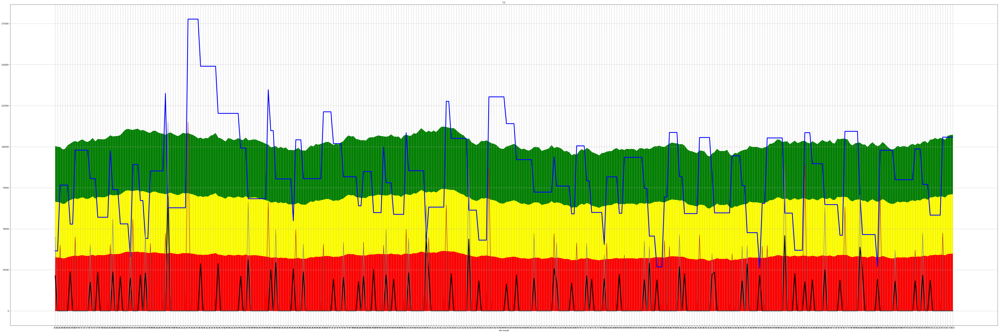

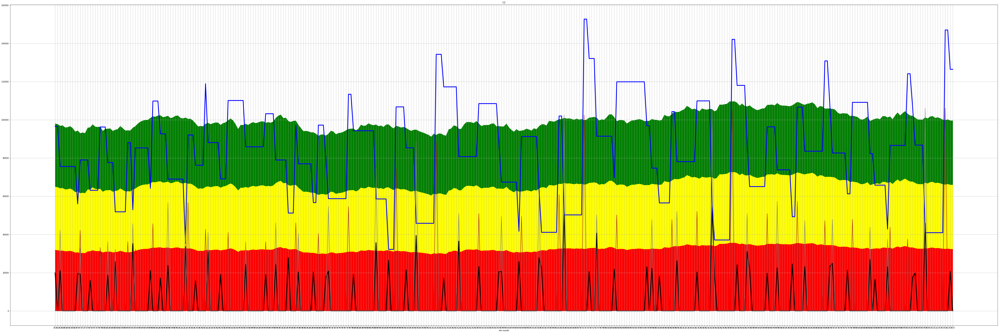

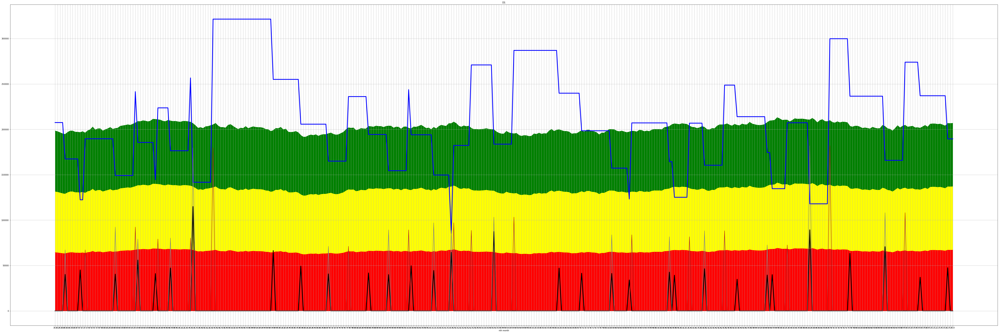

In [ ]:
# graph
for y in lis:
  dic[(y, cuckoo -1)].plot_inventorylevel()

In [ ]:
# Table
from tabulate import tabulate

start =361
mydata =[]
for i in lis:
  mydata.append([i, 
                 globals()[i+"_demand"][start:].mean()[0],
                 globals()[i+"_demand"][start:].std()[0]/(globals()[i+"_demand"][start:].mean()+0.000000001)[0],
                 globals()[i+"_OrderOnHand"], #--
                 globals()[i+"_LT"], #--
                 globals()[i+"_MOQ"], #--
                 globals()[i+"_desiredorder"], #--
                 globals()[i+"_LTAdj"], #--
                 globals()[i+"_varAdj"], #--
                 globals()[i+"_ADUBackTrack"], #--
                 mean(dic[(i, cuckoo-1)].hist_onhand[start:]),
                 sum(dic[(i, cuckoo-1)].NumOrder[start:]), 
                 sum(dic[(i, cuckoo-1)].stockout[start:]), 
                 mean(dic[(i, cuckoo-1)].hist_fillrate[start:])
                 ])
  
head = ["Node", "Avg Demand", "Norm Std Demand", "Initial Onhand", "Lead Time (Day)", "MOQ", "Desired Order Freq (Day)",  "Lead Time Adjust", "Var Adjust", \
         "ADU Back Track (Day)", "Avg Onhand", "Order Freq", "Num of Stockout", "Fill Rate"]
print(tabulate(mydata, headers=head, tablefmt="grid")) 

mydata = pd.DataFrame(mydata)
mydata.to_excel(r'/content/gdrive/My Drive/DDMRP/Sensitivity Analysis/DDMRP Sim_' + scenario_name + '/Output.xlsx', index = False)

+--------+--------------+-------------------+------------------+-------------------+-------+----------------------------+--------------------+--------------+------------------------+--------------+--------------+-------------------+-------------+
| Node   |   Avg Demand |   Norm Std Demand |   Initial Onhand |   Lead Time (Day) |   MOQ |   Desired Order Freq (Day) |   Lead Time Adjust |   Var Adjust |   ADU Back Track (Day) |   Avg Onhand |   Order Freq |   Num of Stockout |   Fill Rate |
+========+==============+===================+==================+===================+=======+============================+====================+==============+========================+==============+==============+===================+=============+
| A1     |      1011.65 |          0.851532 |            15680 |                 8 |     1 |                          8 |                0.6 |          0.6 |                     60 |      13455.2 |           40 |                 1 |    0.999852 |
+--------+--

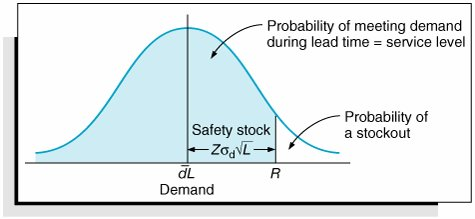

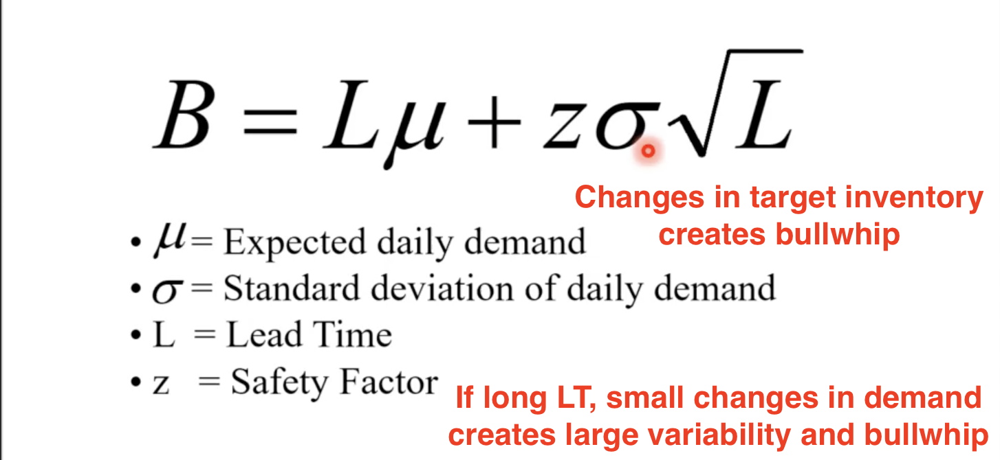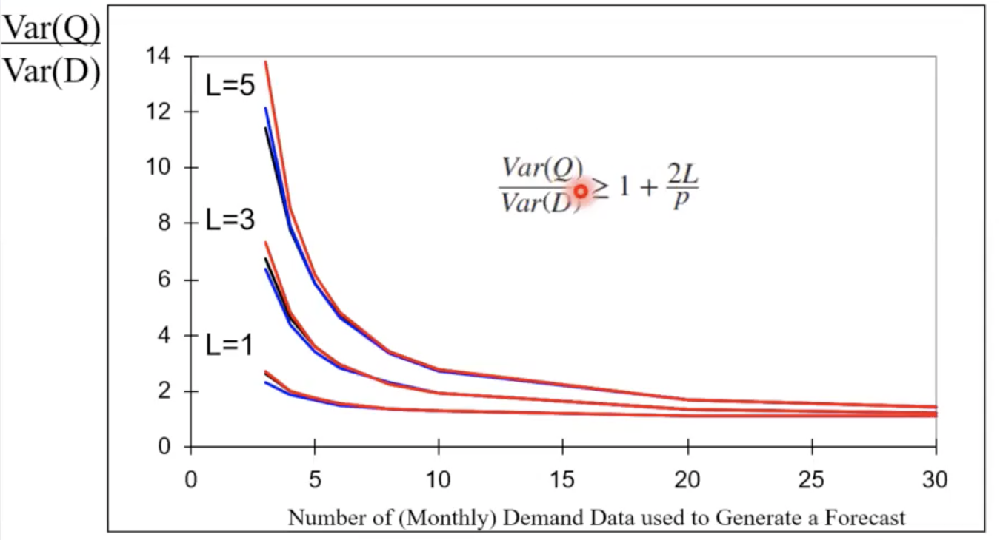

In [ ]:
from google.colab import drive
drive.mount('/content/drive')